In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import kendalltau
import matplotlib.gridspec as gridspec
%matplotlib notebook

coordinate_header = ['FrameNumber', 'MouthHook_x', 'MouthHook_y', 'LeftMHhook_x', 'LeftMHhook_y',
                     'RightMHhook_x', 'RightMHhook_y', 'LeftDorsalOrgan_x', 'LeftDorsalOrgan_y',
                     'RightDorsalOrgan_x', 'RightDorsalOrgan_y', 'CenterBolwigOrgan_x', 'CenterBolwigOrgan_y',
                     'LeftBolwigOrgan_x', 'LeftBolwigOrgan_y', 'RightBolwigOrgan_x', 'RightBolwigOrgan_y']

meta_data_header = ['FrameNumber', 'Time', 'Stage_x', 'Stage_y', 'Centroid_x', 'Centroid_y',
                    'Midpoint_x', 'Midpoint_y', 'Head_x', 'Head_y', 'Tail_x', 'Tail_y','MouthHook_x', 'MouthHook_y',
                    'LeftMHhook_x', 'LeftMHhook_y','RightMHhook_x', 'RightMHhook_y', 
                    'LeftDorsalOrgan_x', 'LeftDorsalOrgan_y', 'RightDorsalOrgan_x', 'RightDorsalOrgan_y',
                    'CenterBolwigOrgan_x', 'CenterBolwigOrgan_y','LeftBolwigOrgan_x', 'LeftBolwigOrgan_y',
                    'RightBolwigOrgan_x', 'RightBolwigOrgan_y', 'V9_x', 'V9_y', 'V10_x', 'V10_y', 'V11_x','V11_y',
                    'V12_x', 'V12_y', 'V13_x', 'V13_y', 'V14_x', 'V14_y', 'V15_x', 'V15_y', 'V16_x', 'V16_y',
                    'MouthHook_votes', 'LeftMHhook_votes', 'RightMHhook_votes', 'LeftDorsalOrgan_votes',
                    'RightDorsalOrgan_votes', 'CenterBolwigOrgan_votes', 'LeftBolwigOrgan_votes', 'RightBolwigOrgan_votes',
                    'V9_votes', 'V10_votes', 'V11_votes', 'V12_votes', 'V13_votes', 'V14_votes', 'V15_votes',
                    'V16_votes', 'Num_Key_points']

distance_header = ['MouthHook', 'LeftMHhook',
                   'RightMHhook', 'LeftDorsalOrgan', 'RightDorsalOrgan',
                   'CenterBolwigOrgan','LeftBolwigOrgan', 'RightBolwigOrgan']

meta_data_votes_header = ['MouthHook_votes', 'LeftMHhook_votes', 'RightMHhook_votes', 'LeftDorsalOrgan_votes',
                          'RightDorsalOrgan_votes', 'CenterBolwigOrgan_votes', 'LeftBolwigOrgan_votes',
                          'RightBolwigOrgan_votes', 'Num_Key_points']

def simpleaxis(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    
def calcDistance(meta_data, coordinates):
    temp = (meta_data - coordinates).apply(lambda x: x**2)
    distance = pd.DataFrame([], columns=distance_header, index=coordinates.index.values)
    for head in distance_header:
        not_present = np.array([])
        distance.loc[:, head] = (temp.loc[:,head+'_x'] + temp.loc[:,head+'_y']).apply(lambda x: np.sqrt(x))
        not_present = coordinates.loc[:, head+'_x'] == -1
        if np.where(not_present)[0].size != 0:
            distance.loc[not_present, head] = np.NaN
        distance['FrameNumber'] = coordinates.index.values
    return distance

# def getROC

/Users/ajinkyadeogade/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


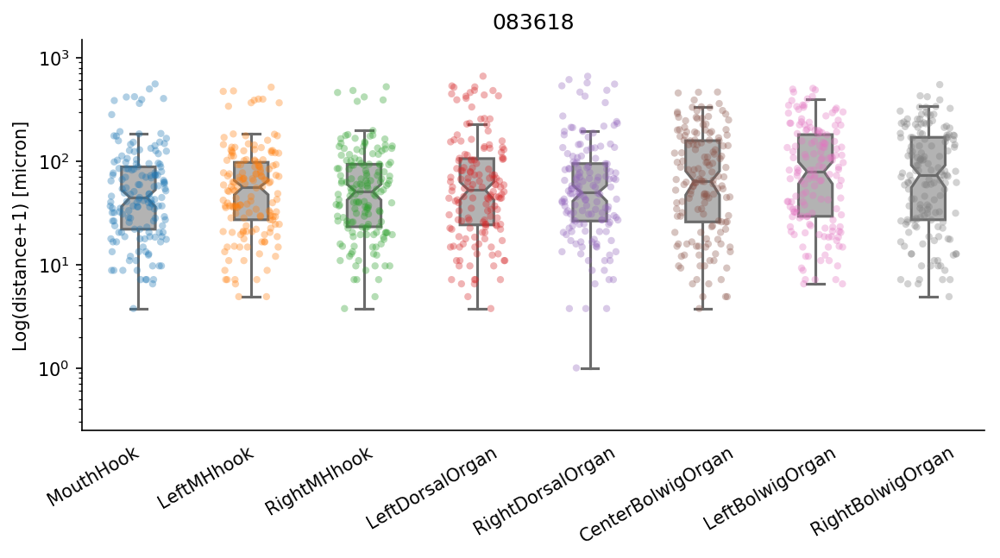

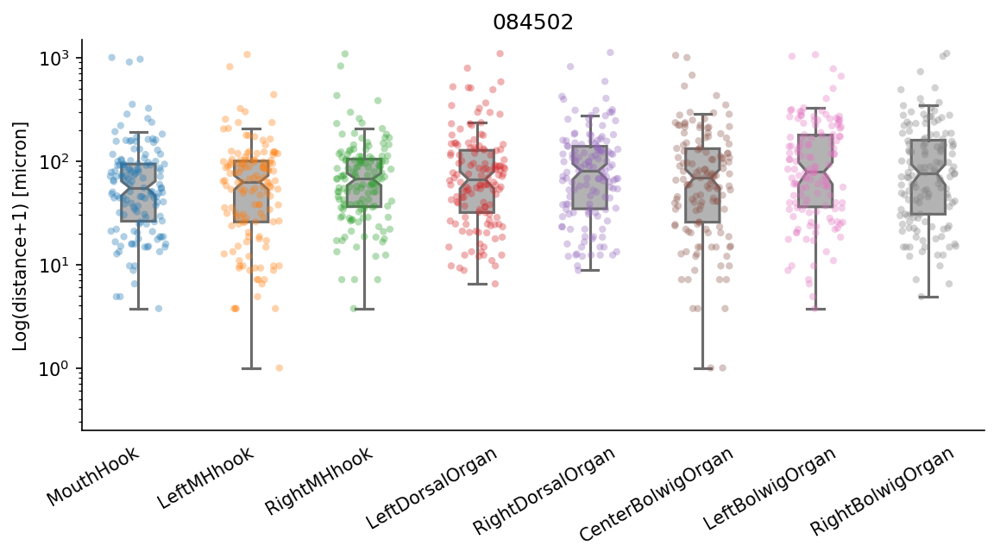

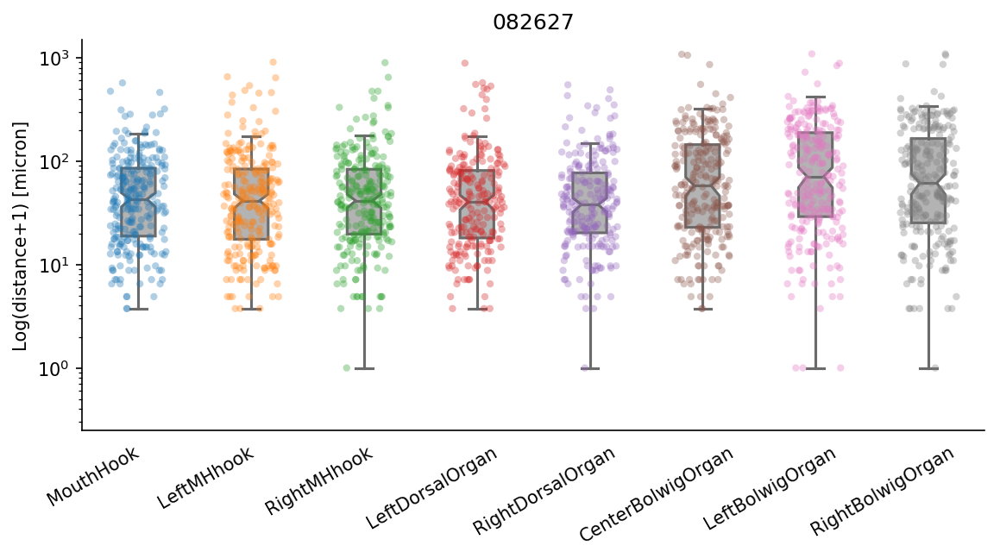

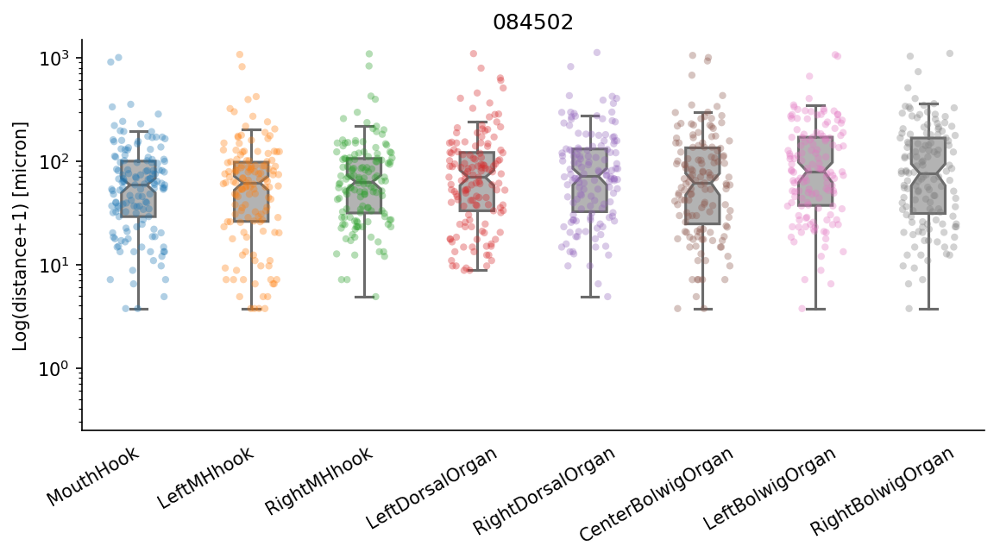

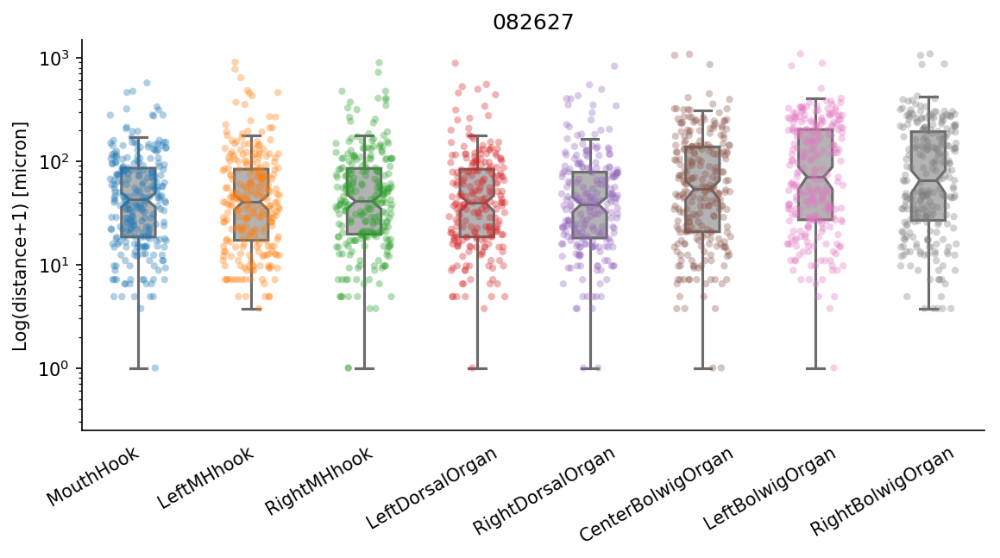

...

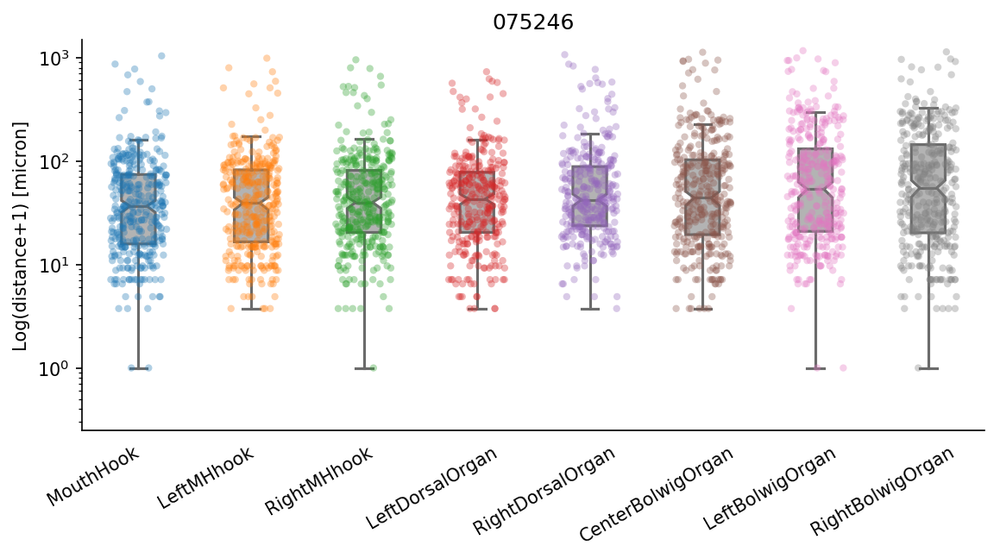

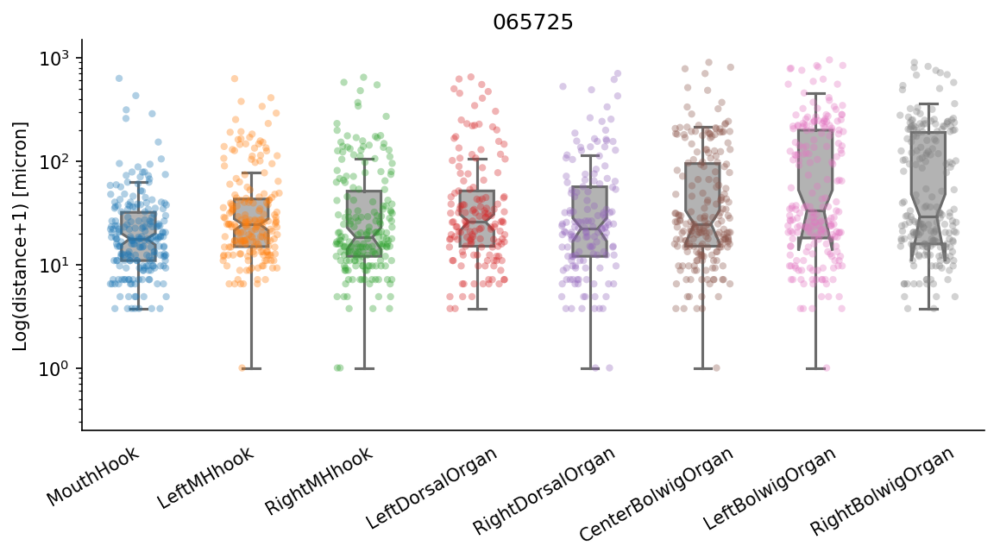

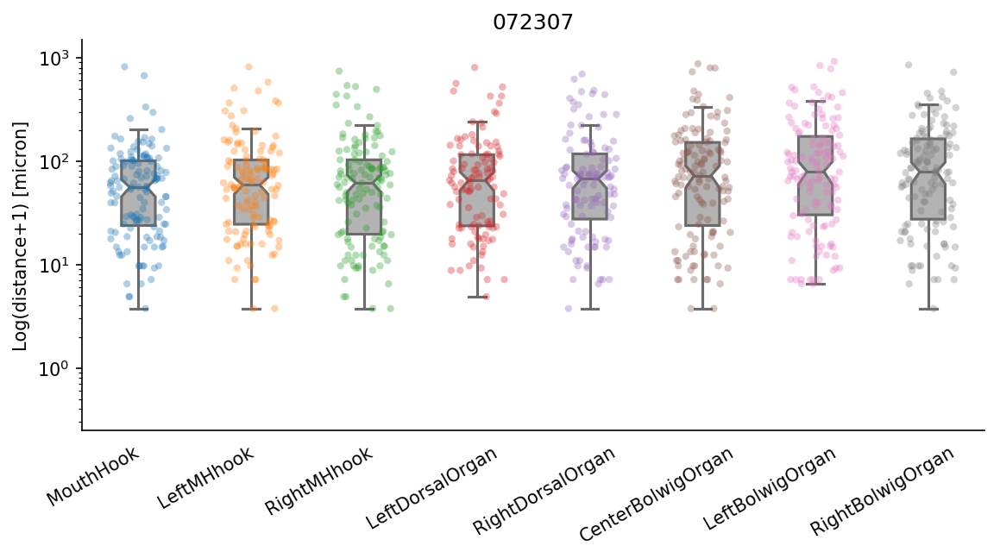

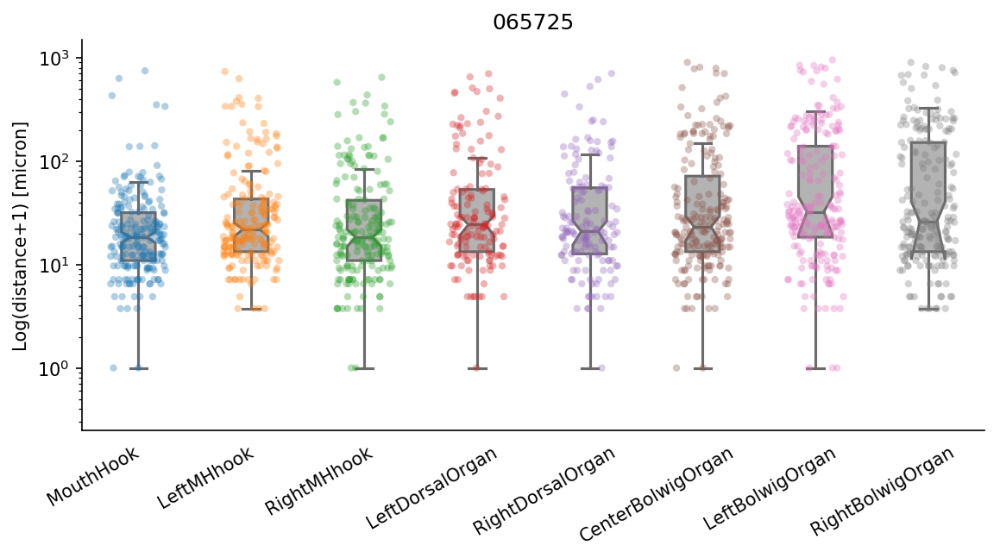

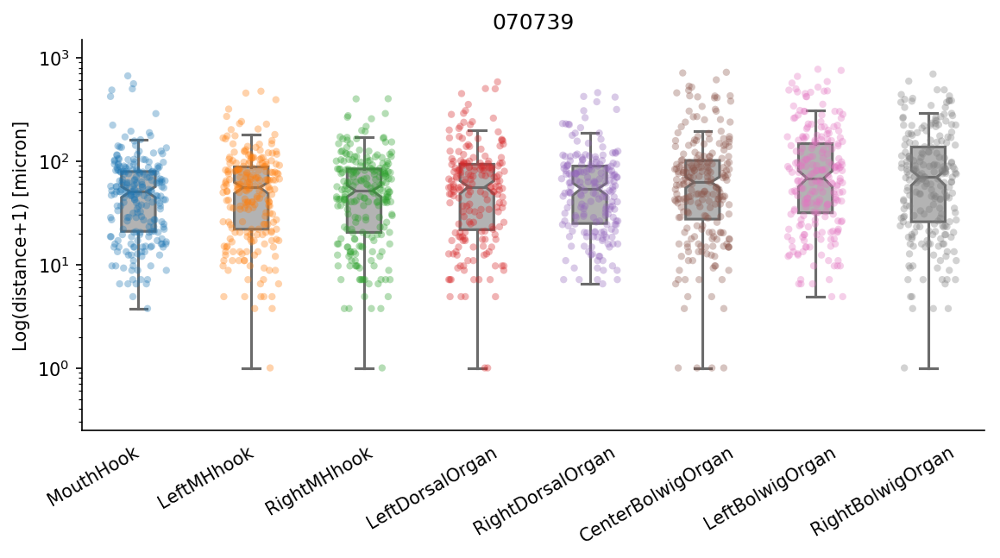

In [2]:
# Grp 1
# test_list_file = '../expts/dataCollectedOn_20180417/dataCollectedOn_2018041_grp_1/20180529_150721/dataCollectedOn_2018041_grp_1_test.txt'

# Grp 2
# test_list_file = '../expts/dataCollectedOn_20180417/dataCollectedOn_2018041_grp_2/20180529_150807/dataCollectedOn_2018041_grp_2_test.txt'

# Grp 3
# test_list_file = '../expts/dataCollectedOn_20180417/dataCollectedOn_2018041_grp_3/20180529_150848/dataCollectedOn_2018041_grp_3_test.txt'

test_grps_list = '../config/test_groups_list'
it = -1
with open(test_grps_list.strip()) as test_grps:
    for grp in test_grps:
        test_list_file_parent = os.path.split(grp)[0]
        all_test_dir = []
        pixel_to_micron = 2.75
        with open(grp.strip()) as test_list:
            for test_file in test_list:
                test_string = str.split(os.path.split(
                    test_file.strip())[1], '_Coordinates')[0]
                test_dir = os.path.join(test_list_file_parent, test_string)
                test_string = str.split(test_string, '_')[2]
                all_test_dir.append(test_dir)
                coordinates = pd.DataFrame([])
                meta_data = pd.DataFrame([])
                distance = []
                it += 1
                for fs in os.listdir(test_dir):
                    if 'Coordinates' in fs:
                        coordinates = pd.read_csv(os.path.join(
                            test_dir, fs), sep=',', names=coordinate_header)
                    if 'Metadata' in fs:
                        meta_data = pd.read_csv(os.path.join(
                            test_dir, fs), sep=',', header=0, names=meta_data_header)

                if (coordinates.empty is False) and (meta_data.empty is False):
                    coordinates = coordinates.round(0)
                    start_frame = coordinates.loc[0, 'FrameNumber'] - 1
                    coordinates.set_index('FrameNumber', inplace=True)

                    meta_data = meta_data[meta_data.Num_Key_points != 0]
                    meta_data.loc[:, 'FrameNumber'] = meta_data.loc[:,
                                                                    'FrameNumber'] + start_frame
                    meta_data.set_index('FrameNumber', inplace=True)
                    meta_data_sel = meta_data.loc[coordinates.index,
                                                  coordinates.columns.values]

                    distance = pd.DataFrame([])
                    distance = calcDistance(meta_data_sel, coordinates)
                    distance.loc[:, distance_header] = distance.loc[:,
                                                                    distance_header]*pixel_to_micron

                    # distance_1.boxplot(figsize=(10, 10), column=distance_header, rot=45)
                    distance_melt = pd.melt(distance, id_vars=['FrameNumber'], value_vars=distance_header,
                                            var_name='BodyPart', value_name='Distance')
                    distance_melt = distance_melt[~distance_melt.loc[:, 'Distance'].isnull(
                    )]
                    distance_melt.loc[:,
                                      'Distance'] = distance_melt.loc[:, 'Distance'] + 1

                    fig = plt.figure(figsize=(9, 4), dpi=150)
                    plt.title(test_string)
                    ax = sns.boxplot(x='BodyPart', y='Distance', data=distance_melt,
                                     color=".7", fliersize=0, width=0.3, notch=True)
    #                 ax = sns.violinplot(x='variable', y='value', data=distance_melt, cut=0.25, inner='box', scale='count')
    #                 ax = sns.swarmplot(x='variable', y='value', data=distance_melt, color=".4", size=4)
                    ax = sns.stripplot(x='BodyPart', y='Distance', data=distance_melt,
                                       size=4, jitter=0.25, alpha=.35)
                    sns.despine()
                    ax.set_yscale("log")
                    present_xticks = ax.get_xticks()
                    plt.xticks(present_xticks-0.4, rotation=30)
                    ax.xaxis.set_ticks_position('none')
                    plt.xlabel('')
                    plt.ylabel('Log(distance+1) [micron]')
                    plt.ylim([0.25, 1500])
                    fname = os.path.join(test_dir, 'box_plot_distance.png')
                    plt.savefig(fname, dpi=180, bbox_inches='tight')

                    q = distance.quantile([.10, 0.25, 0.5, 0.75, 0.9])
                    q.reset_index(inplace=True)
                    q.rename(columns={'index': 'quantiles'}, inplace=True)
                    q_melt = pd.melt(
                        q, id_vars=['quantiles'], var_name='BodyPart', value_name=test_string)
#                     q_melt_all = pd.merge(q_melt_all, q_melt, on=['index', 'BodyPart'])
                    if it == 0:
                        q_melt_all = q_melt
                    else:
                        q_melt_all = pd.concat(
                            [q_melt_all, q_melt.loc[:, test_string]], axis=1)
                else:
                    print "Either Coordinates or Metadata file is missing for %s" % (
                        os.path.join(test_dir, fs))

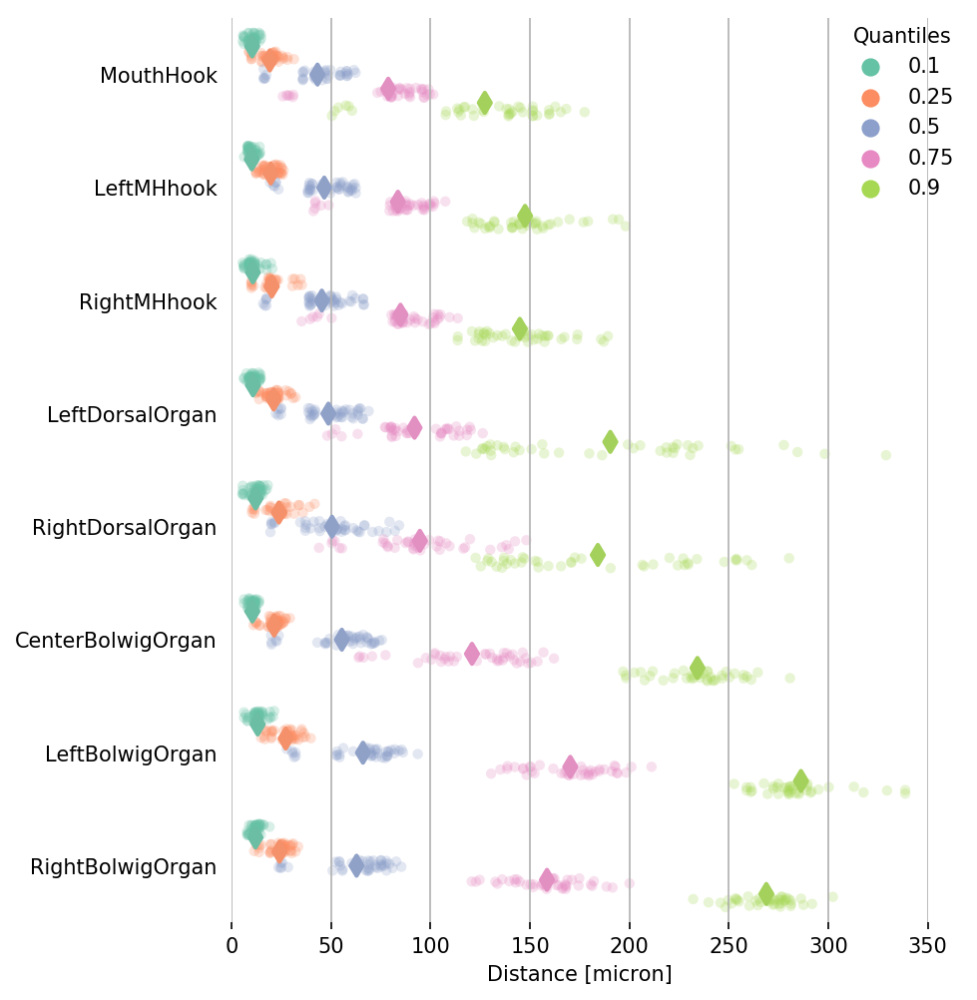

In [3]:
s = q_melt_all.columns.values.tolist()
l3 = [x for x in s if x not in ['quantiles', 'BodyPart']]
q_melt_all_all = pd.melt(q_melt_all, id_vars=['quantiles', 'BodyPart'], var_name='SampleName', value_name='Distance')
fig = plt.figure(figsize=(6,8), dpi=150)
# sns.set(style="whitegrid")
temp_data = q_melt_all_all.loc[q_melt_all_all.BodyPart != 'FrameNumber', :]
ax = sns.stripplot(x='Distance', y='BodyPart', hue='quantiles',
                   dodge=True, data=temp_data, size=5,
                   jitter=0.25, alpha=.25, palette='Set2', zorder=1)
ax = sns.pointplot(x="Distance", y="BodyPart", hue="quantiles",
                   dodge=0.5, data=temp_data,  join=False,
                   markers="d", ci=None, palette=sns.color_palette("Set2", desat=.9), size=0.5)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sns.despine(bottom=True, left=True)
ax.xaxis.grid(True)
# ax.set_xscale("log")
plt.xlim([0, 350]);
# present_xticks = ax.get_xticks()
# plt.xticks(present_xticks-0.4, rotation=30);
ax.yaxis.set_ticks_position('none')
plt.ylabel('');
plt.xlabel('Distance [micron]');

# g = sns.factorplot(x="BodyPart", y="Distance",
#                    hue="BodyPart", col="quantiles",
#                    data=q_melt_all_all, kind="strip",
#                    jitter=True,size=4, aspect=.7);
# Improve the legend 
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:5], labels[:5], title="Quantiles",
          bbox_to_anchor=(1.05, 1), borderaxespad=0., frameon=False)

fname = os.path.join(test_dir, 'box_plot_all_distance.png')
plt.savefig(fname, dpi=300, bbox_inches='tight')

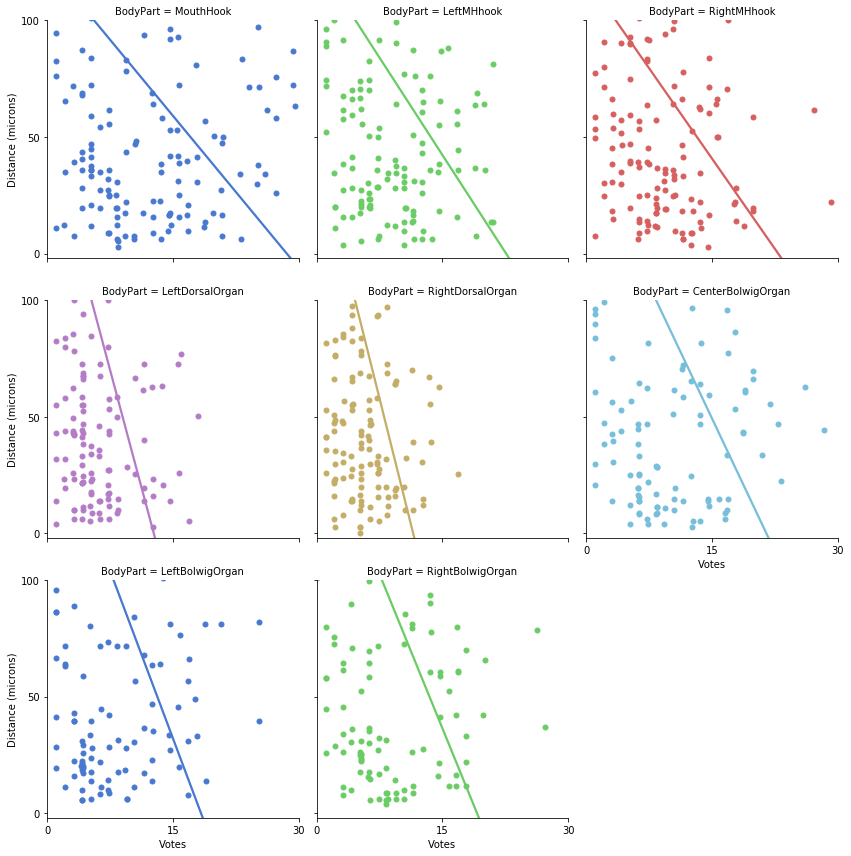

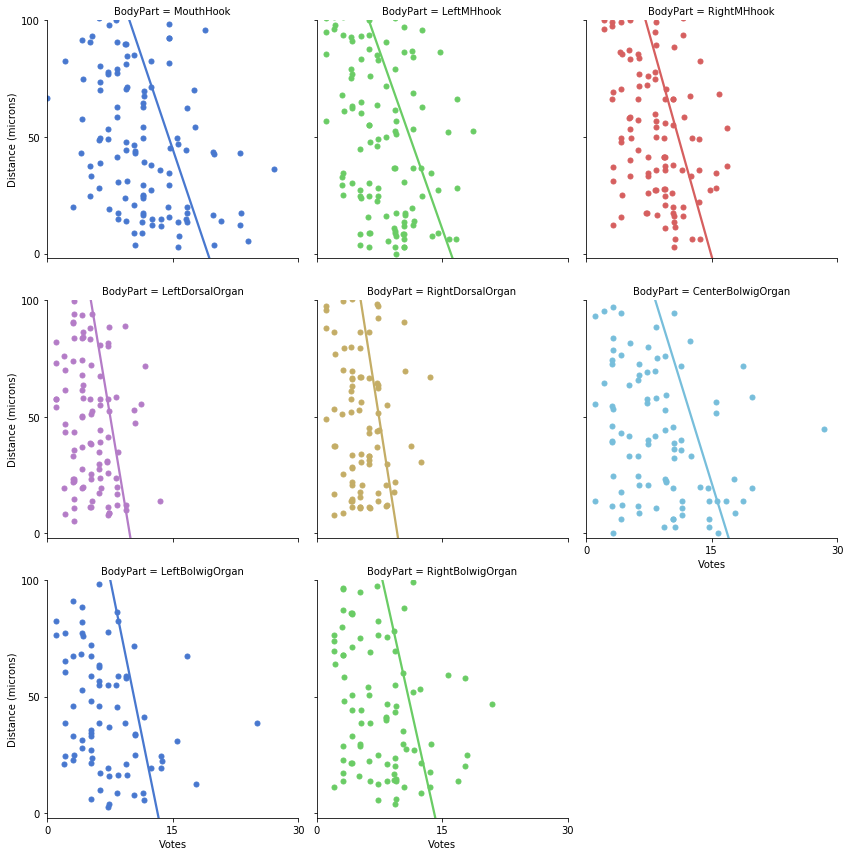

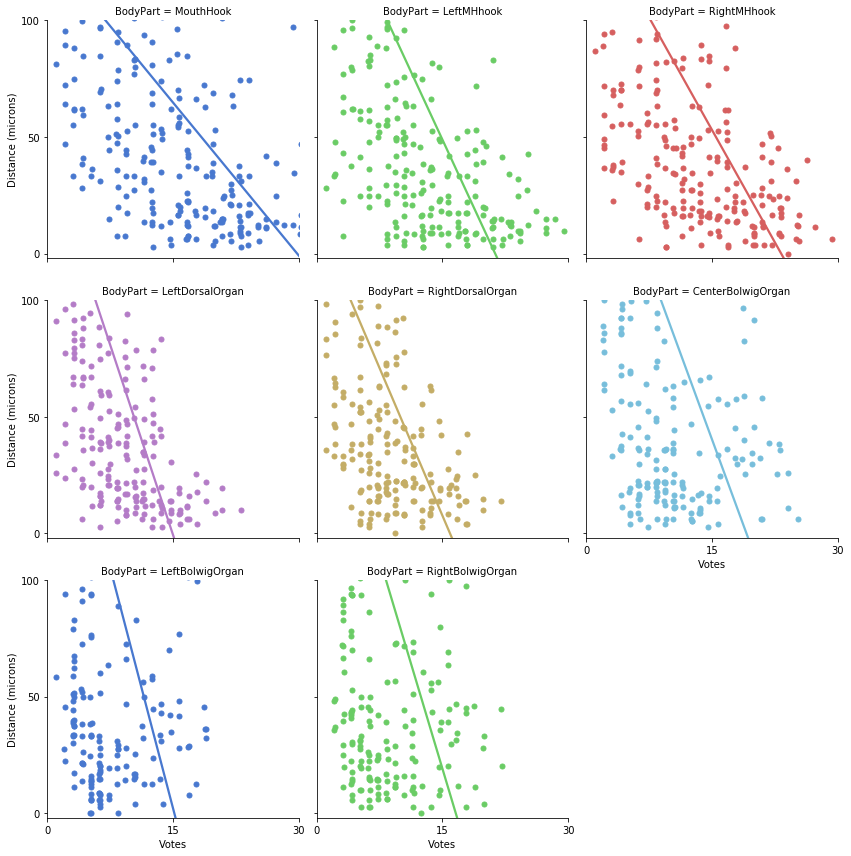

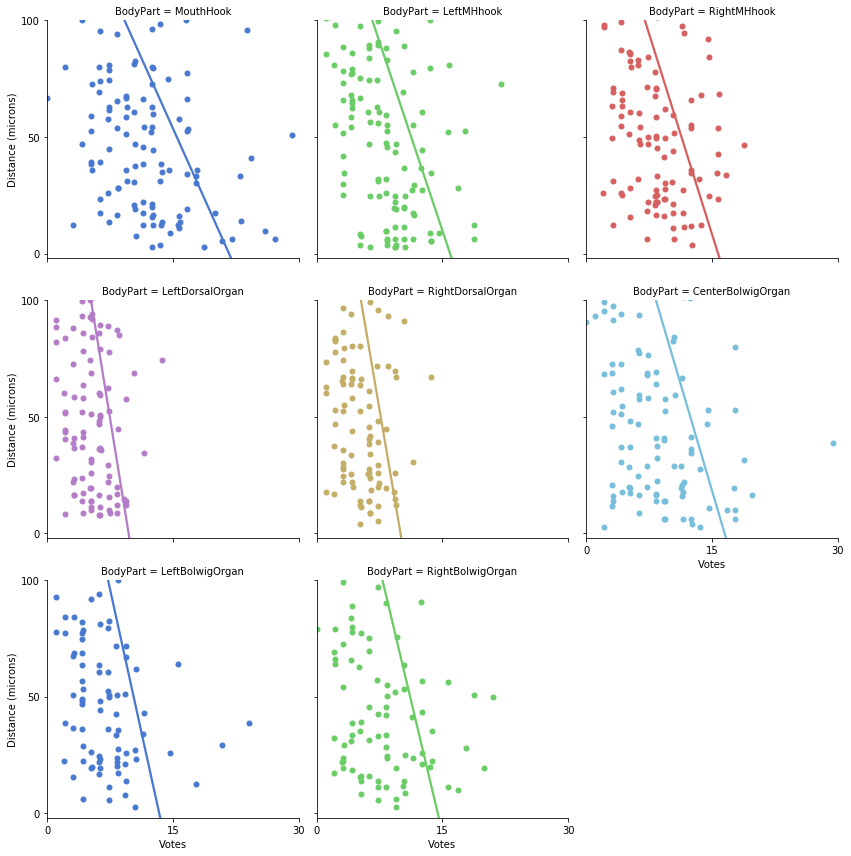

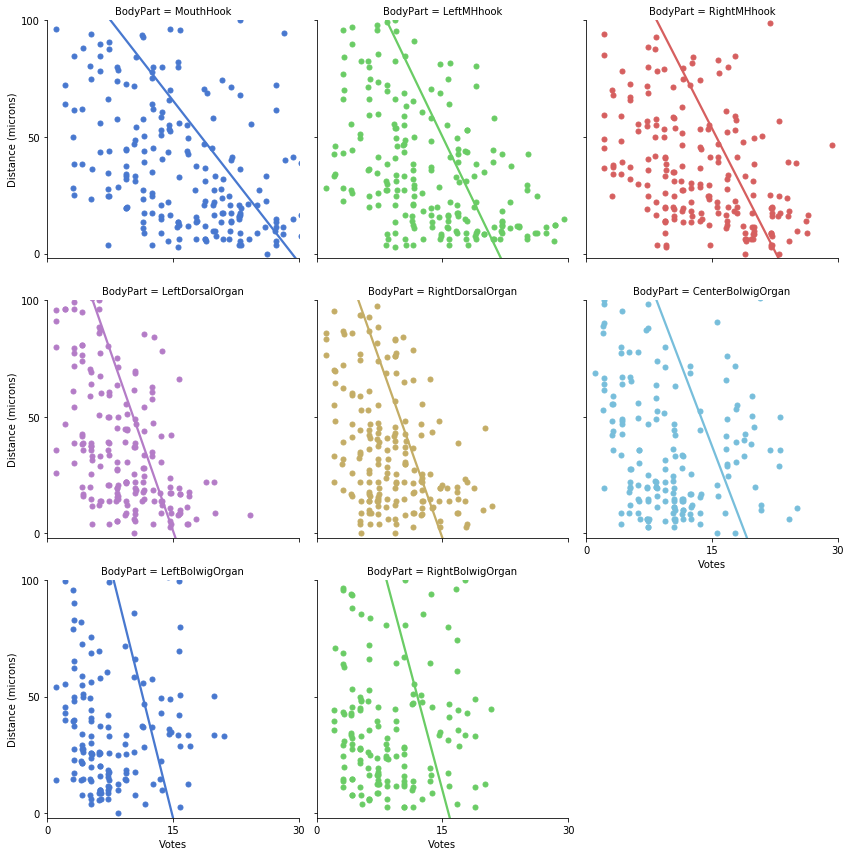

...

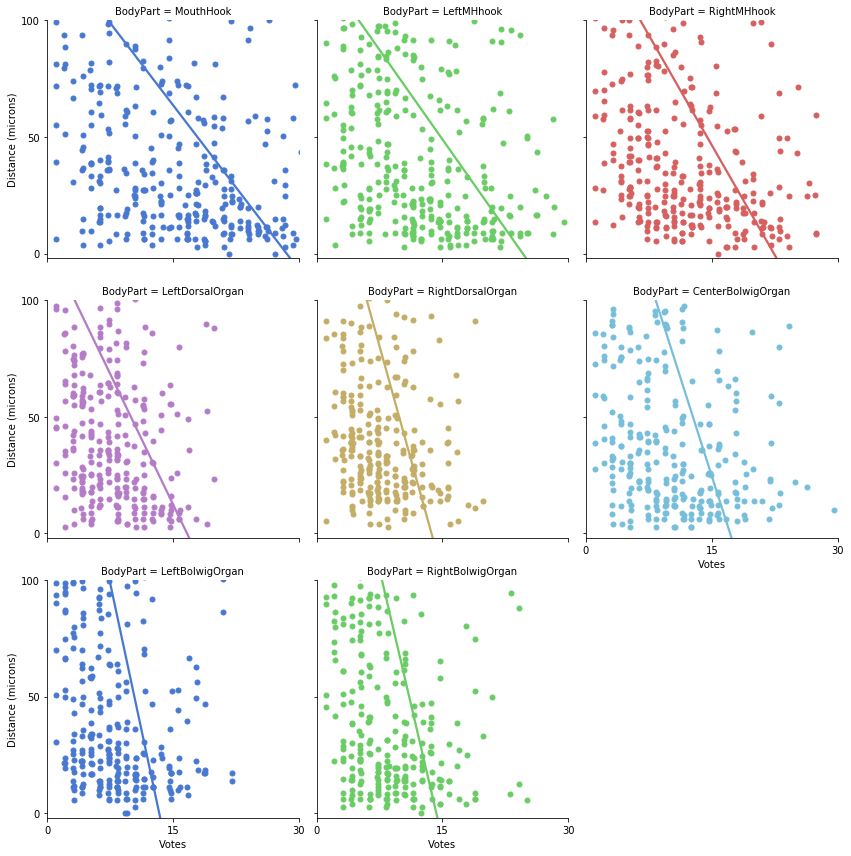

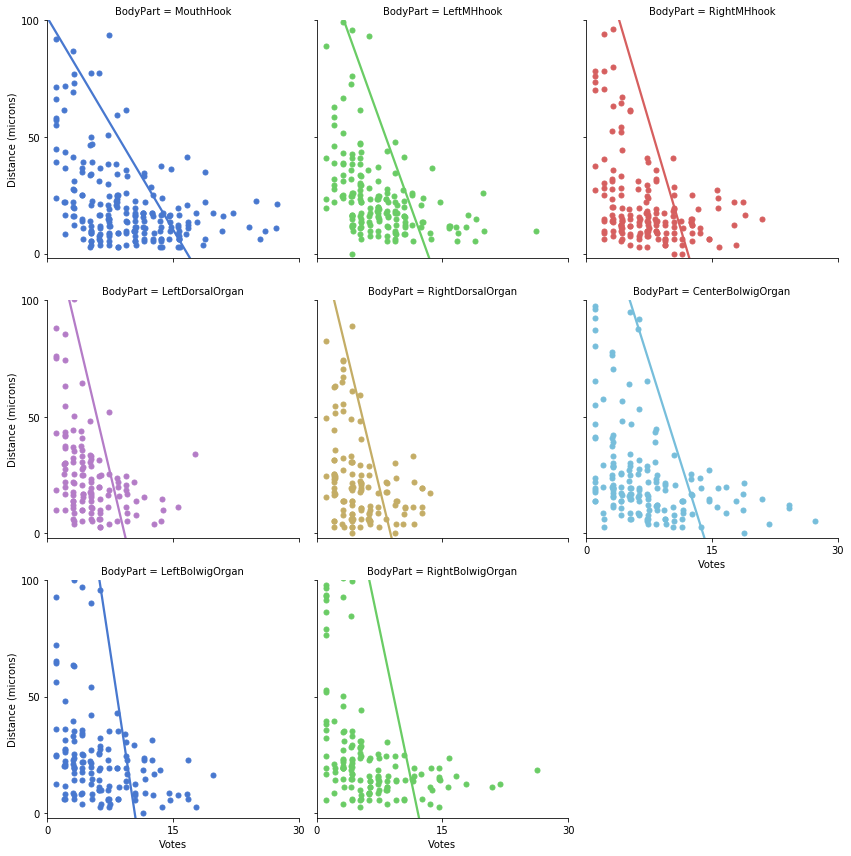

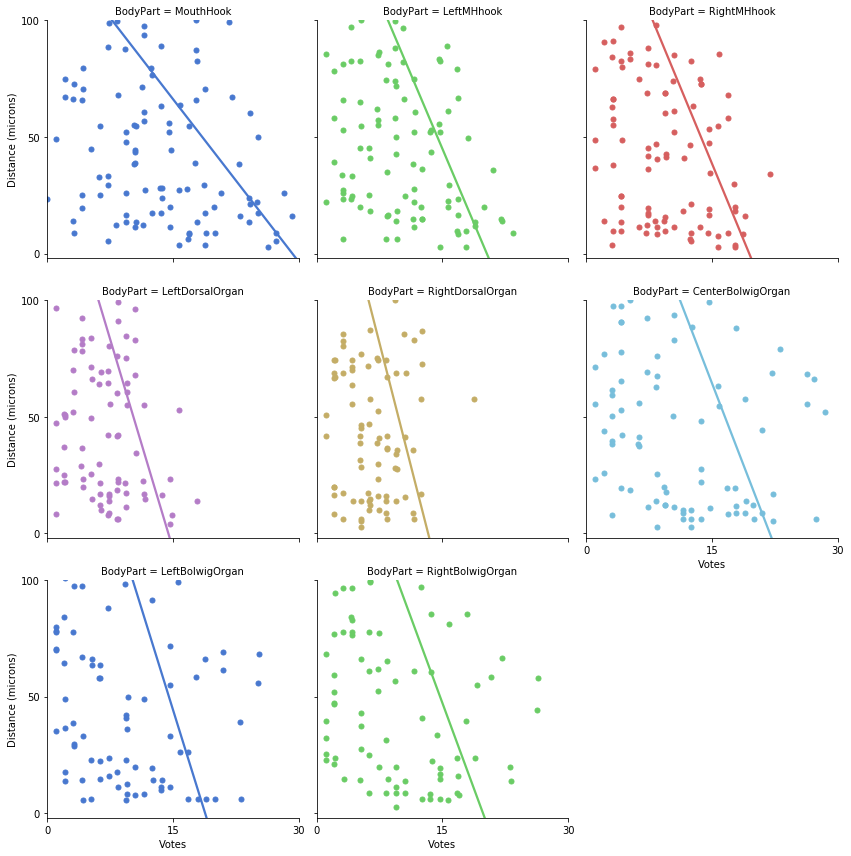

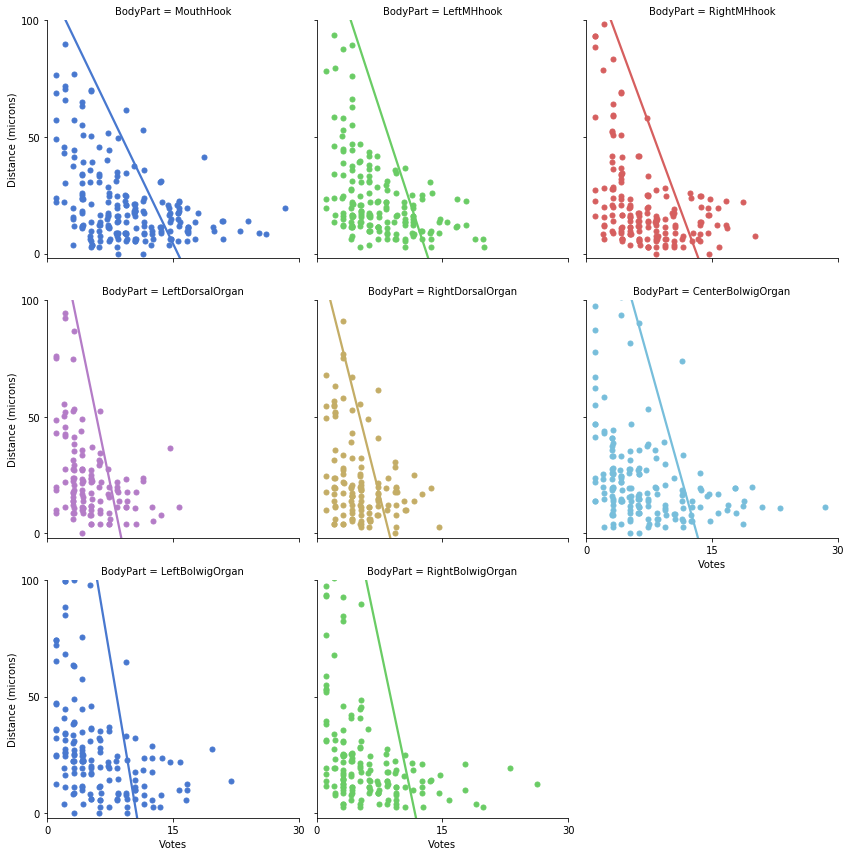

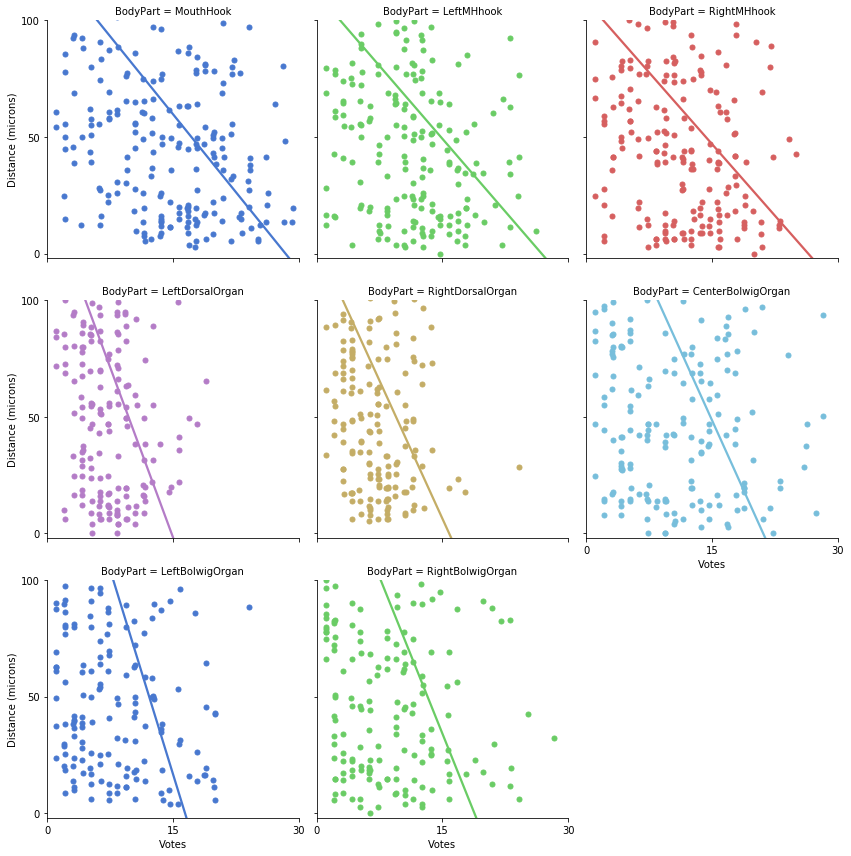

In [9]:
test_grps_list = '../config/test_groups_list'
it = -1
with open(test_grps_list.strip()) as test_grps:
    for grp in test_grps:
        test_list_file_parent = os.path.split(grp)[0]
        all_test_dir = []
        pixel_to_micron = 2.75
        with open(grp.strip()) as test_list:
            for test_file in test_list:
                test_string = str.split(os.path.split(test_file.strip())[1], '_Coordinates')[0]
                test_dir = os.path.join(test_list_file_parent, test_string)
                all_test_dir.append(test_dir)
                coordinates = pd.DataFrame([])
                meta_data = pd.DataFrame([])
                distance = []
                for fs in os.listdir(test_dir):
                    if 'Coordinates' in fs:
                        coordinates = pd.read_csv(os.path.join(test_dir, fs), sep=',', names=coordinate_header)
                    if 'Metadata' in fs:
                        meta_data = pd.read_csv(os.path.join(test_dir, fs), sep=',', header=0, names=meta_data_header)

                if (coordinates.empty is False) and (meta_data.empty is False):
                    coordinates = coordinates.round(0)
                    start_frame = coordinates.loc[0,'FrameNumber'] - 1
                    coordinates.set_index('FrameNumber', inplace=True)

                    meta_data = meta_data[meta_data.Num_Key_points != 0]
                    meta_data.loc[:,'FrameNumber'] = meta_data.loc[:,'FrameNumber'] + start_frame
                    meta_data.set_index('FrameNumber', inplace=True)
                    meta_data_sel = meta_data.loc[coordinates.index, coordinates.columns.values]

                    votes = meta_data.loc[coordinates.index, meta_data_votes_header]
                    votes.columns = distance_header + ['Num_Key_points']
                    votes.reset_index(inplace=True)

                    distance = pd.DataFrame([])
                    distance = calcDistance(meta_data_sel, coordinates)
                    distance.loc[:, distance_header] = distance.loc[:, distance_header]*pixel_to_micron

                    # distance_1.boxplot(figsize=(10, 10), column=distance_header, rot=45)
                    distance_melt = pd.melt(distance, id_vars=['FrameNumber'], value_vars=distance_header, 
                                            var_name='BodyPart', value_name='Distance')
                    votes_melt = pd.melt(votes, id_vars=['FrameNumber'], value_vars=distance_header,
                                            var_name='BodyPart', value_name='Votes')

        #                 present_yticks = ax.get_yticks()
        #                 ax.set_yticklabels([np.round(10**yt, 1) for yt in present_yticks]);
                    distance_votes_melt = pd.merge(distance_melt, votes_melt, on=['FrameNumber', 'BodyPart'])
                    g = sns.lmplot(x="Votes", y="Distance", col="BodyPart", hue="BodyPart", data=distance_votes_melt,
                                   col_wrap=3, ci=None, palette="muted", size=4,
                                   scatter_kws={"s": 25, "alpha": 1})
                    g = (g.set_axis_labels("Votes", "Distance (microns)").
                         set(xlim=(0, 30), ylim=(-2, 100), xticks=[0, 15, 30], 
                             yticks=[0, 50, 100]))
                    fname = os.path.join(test_dir, 'scattter_plot_vote_vs_distance.png')
                    plt.savefig(fname, dpi=300, bbox_inches='tight')
                else:
                    print "Either Coordinates or Metadata file is missing for %s"%(os.path.join(test_dir, fs))

In [ ]:
# test_list_file_parent = os.path.split(test_list_file)[0]
# all_test_dir = []
# pixel_to_micron = (1.0/2.75)
# with open(test_list_file) as test_list:
#         for test_file in test_list:
#             test_string = str.split(os.path.split(test_file.strip())[1], '_Coordinates')[0]
#             test_dir = os.path.join(test_list_file_parent, test_string)
#             all_test_dir.append(test_dir)
#             coordinates = pd.DataFrame([])
#             meta_data = pd.DataFrame([])
#             distance = []
#             for fs in os.listdir(test_dir):
#                 if 'Coordinates' in fs:
#                     coordinates = pd.read_csv(os.path.join(test_dir, fs), sep=',', names=coordinate_header)
#                 if 'Metadata' in fs:
#                     meta_data = pd.read_csv(os.path.join(test_dir, fs), sep=',', header=0, names=meta_data_header)
                    
#             if (coordinates.empty is False) and (meta_data.empty is False):
#                 coordinates = coordinates.round(0)
#                 start_frame = coordinates.loc[0,'FrameNumber'] - 1
#                 coordinates.set_index('FrameNumber', inplace=True)

#                 meta_data = meta_data[meta_data.Num_Key_points != 0]
#                 meta_data.loc[:,'FrameNumber'] = meta_data.loc[:,'FrameNumber'] + start_frame
#                 meta_data.set_index('FrameNumber', inplace=True)
#                 meta_data_sel = meta_data.loc[coordinates.index, coordinates.columns.values]
                
#                 votes = meta_data.loc[coordinates.index, meta_data_votes_header]
#                 votes.columns = distance_header
#                 votes.reset_index(inplace=True)
                
#                 distance = pd.DataFrame([])
#                 distance = calcDistance(meta_data_sel, coordinates)
#                 distance.loc[:, distance_header] = distance.loc[:, distance_header]*pixel_to_micron

#                 # distance_1.boxplot(figsize=(10, 10), column=distance_header, rot=45)
#                 distance_melt = pd.melt(distance, id_vars=['FrameNumber'], value_vars=distance_header, 
#                                         var_name='BodyPart', value_name='Distance')
#                 votes_melt = pd.melt(votes, id_vars=['FrameNumber'], value_vars=distance_header,
#                                         var_name='BodyPart', value_name='Votes')
                
#                 distance_votes_melt = pd.merge(distance_melt, votes_melt, on=['FrameNumber', 'BodyPart'])
# #                 distance_votes_melt = distance_votes_melt[distance_votes_melt.Votes != 0]
                
# #                 ax = sns.boxplot(x='BodyPart', y='Distance', data=distance_votes_melt,
# #                                  color=".7", fliersize=0, width=0.3, notch=True)
# #                 ax = sns.violinplot(x='variable', y='value', data=distance_melt, cut=0.25, inner='box', scale='count')
# #                 ax = sns.swarmplot(x='variable', y='value', data=distance_melt, color=".4", size=4)                distance_votes_melt
#                 distance_votes_melt['VoteCat'] = 
    
#                 ax = sns.stripplot(x='BodyPart', y='Distance', data=distance_votes_melt,
#                                    size=4, jitter=0.25, alpha=.35)
#                 sns.despine()
# #                 ax.set_yscale("log")
#                 present_xticks = ax.get_xticks()
#                 plt.xticks(present_xticks-0.4, rotation=30);
#                 ax.xaxis.set_ticks_position('none')
#                 plt.xlabel('');
#                 plt.ylabel('Log Distance (micron)');

# #                 y_max = 70
#                 plt.ylim([0.25, 100]);
    
# #                 distance_votes_melt = distance_votes_melt[distance_votes_melt.Votes != 0]
                
# #                 g = sns.lmplot(x="Votes", y="Distance", col="BodyPart", hue="BodyPart", data=distance_votes_melt,
# #                                col_wrap=3, ci=None, palette="muted", size=4,
# #                                scatter_kws={"s": 25, "alpha": 1})
# #                 g = (g.set_axis_labels("Votes", "Distance (microns)").
# #                      set(xlim=(0, 30), ylim=(-2, 50), xticks=[0, 15, 30], 
# #                          yticks=[0, 25, 50]))                
#             else:
#                 print "Either Coordinates or Metadata file is missing for %s"%(os.path.join(test_dir, fs))

In [5]:
test_grps_list = '../config/test_groups_list'
it = -1
distance_votes_melt_all = pd.DataFrame([], columns=['FrameNumber','BodyPart','Distance','Votes','grp'])
with open(test_grps_list.strip()) as test_grps:
    for grp in test_grps:
        test_list_file_parent = os.path.split(grp)[0]
        all_test_dir = []
        pixel_to_micron = 2.75
        grp_num  = str.split(grp, '_grp_')[2].split('_')[0]
        with open(grp.strip()) as test_list:
            for test_file in test_list:
                test_string = str.split(os.path.split(test_file.strip())[1], '_Coordinates')[0]
                test_dir = os.path.join(test_list_file_parent, test_string)
                test_string = str.split(test_string, '_')[2]
                all_test_dir.append(test_dir)
                coordinates = pd.DataFrame([])
                meta_data = pd.DataFrame([])
                distance = []
                for fs in os.listdir(test_dir):
                    if 'Coordinates' in fs:
                        coordinates = pd.read_csv(os.path.join(test_dir, fs), sep=',', names=coordinate_header)
                    if 'Metadata' in fs:
                        meta_data = pd.read_csv(os.path.join(test_dir, fs), sep=',', header=0, names=meta_data_header)

                if (coordinates.empty is False) and (meta_data.empty is False):
                    coordinates = coordinates.round(0)
                    start_frame = coordinates.loc[0,'FrameNumber'] - 1
                    coordinates.set_index('FrameNumber', inplace=True)

                    meta_data = meta_data[meta_data.Num_Key_points != 0]
                    meta_data.loc[:,'FrameNumber'] = meta_data.loc[:,'FrameNumber'] + start_frame
                    meta_data.set_index('FrameNumber', inplace=True)
                    meta_data_sel = meta_data.loc[coordinates.index, coordinates.columns.values]

                    votes = meta_data.loc[coordinates.index, meta_data_votes_header]
                    votes.columns = distance_header + ['Num_Key_points']
                    votes.reset_index(inplace=True)

                    distance = pd.DataFrame([])
                    distance = calcDistance(meta_data_sel, coordinates)
                    distance.loc[:, distance_header] = distance.loc[:, distance_header]*pixel_to_micron

                    # distance_1.boxplot(figsize=(10, 10), column=distance_header, rot=45)
                    distance_melt = pd.melt(distance, id_vars=['FrameNumber'], value_vars=distance_header, 
                                            var_name='BodyPart', value_name='Distance')
                    votes_melt = pd.melt(votes, id_vars=['FrameNumber','Num_Key_points'], value_vars=distance_header,
                                            var_name='BodyPart', value_name='Votes')

        #                 present_yticks = ax.get_yticks()
        #                 ax.set_yticklabels([np.round(10**yt, 1) for yt in present_yticks]);
                    distance_votes_melt = pd.merge(distance_melt, votes_melt, on=['FrameNumber', 'BodyPart'])
                    distance_votes_melt.loc[:,'grp'] = grp_num
                    distance_votes_melt.loc[:,'vidID'] = test_string
                
                    distance_votes_melt_all = pd.concat([distance_votes_melt_all, distance_votes_melt])
#                     g = sns.lmplot(x="Votes", y="Distance", col="BodyPart", hue="BodyPart", data=distance_votes_melt,
#                                    col_wrap=3, ci=None, palette="muted", size=4,
#                                    scatter_kws={"s": 25, "alpha": 1})
#                     g = (g.set_axis_labels("Votes", "Distance (microns)").
#                          set(xlim=(0, 30), ylim=(-2, 100), xticks=[0, 15, 30], 
#                              yticks=[0, 50, 100]))
#                     fname = os.path.join(test_dir, 'scattter_plot_vote_vs_distance.png')
#                     plt.savefig(fname, dpi=300, bbox_inches='tight')
                else:
                    print "Either Coordinates or Metadata file is missing for %s"%(os.path.join(test_dir, fs))

/Users/ajinkyadeogade/anaconda2/lib/python2.7/site-packages/pandas/core/generic.py:3660: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


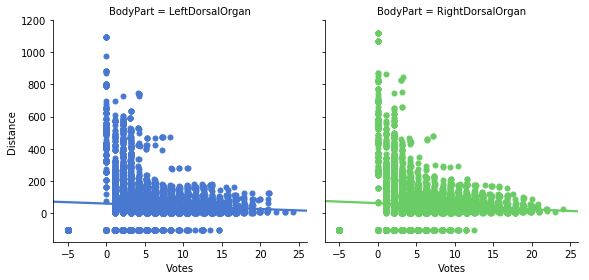

In [6]:
dv_all_do = distance_votes_melt_all.loc[distance_votes_melt_all['BodyPart'].isin(['LeftDorsalOrgan', 'RightDorsalOrgan']), :]
dv_all_do.Votes.fillna(-5, inplace=True)
dv_all_do.Distance.fillna(-100, inplace=True)
dv_all_do.Num_Key_points.fillna(-10, inplace=True)
g = sns.lmplot(x="Votes", y="Distance", col="BodyPart", hue="BodyPart", data=dv_all_do,
               col_wrap=3, ci=None, palette="muted", size=4,
               scatter_kws={"s": 25, "alpha": 1})

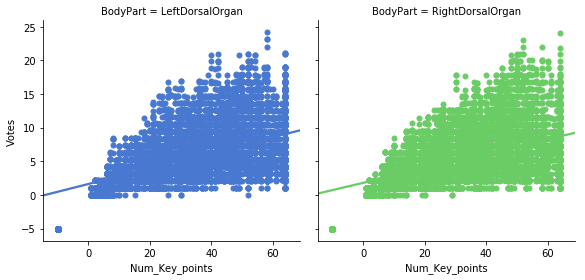

In [7]:
dv_all_do = distance_votes_melt_all.loc[distance_votes_melt_all['BodyPart'].isin(['LeftDorsalOrgan', 'RightDorsalOrgan']), :]
dv_all_do.Votes.fillna(-5, inplace=True)
dv_all_do.Distance.fillna(-100, inplace=True)
dv_all_do.Num_Key_points.fillna(-10, inplace=True)
g = sns.lmplot(x="Num_Key_points", y="Votes", col="BodyPart", hue="BodyPart", data=dv_all_do,
               col_wrap=3, ci=None, palette="muted", size=4,
               scatter_kws={"s": 25, "alpha": 1})

# g = (g.set_axis_labels("Votes", "Distance (microns)").
#      set(xlim=(0, 30), ylim=(-2, 100), xticks=[0, 15, 30], 
#          yticks=[0, 50, 100]))

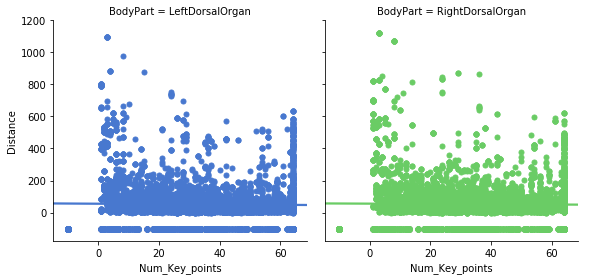

In [8]:
dv_all_do = distance_votes_melt_all.loc[distance_votes_melt_all['BodyPart'].isin(['LeftDorsalOrgan', 'RightDorsalOrgan']), :]
dv_all_do.Votes.fillna(-5, inplace=True)
dv_all_do.Distance.fillna(-100, inplace=True)
dv_all_do.Num_Key_points.fillna(-10, inplace=True)
g = sns.lmplot(x="Num_Key_points", y="Distance", col="BodyPart", hue="BodyPart", data=dv_all_do,
               col_wrap=3, ci=None, palette="muted", size=4,
               scatter_kws={"s": 25, "alpha": 1})

# g = (g.set_axis_labels("Votes", "Distance (microns)").
#      set(xlim=(0, 30), ylim=(-2, 100), xticks=[0, 15, 30], 
#          yticks=[0, 50, 100]))

In [ ]:
dv_all_do = distance_votes_melt_all.loc[distance_votes_melt_all['BodyPart'].isin(['LeftDorsalOrgan', 'RightDorsalOrgan']), :]
dv_all_ldo = dv_all_do.loc[dv_all_do['BodyPart'].isin(['LeftDorsalOrgan']), ['FrameNumber', 'grp', 'Distance', 'vidID']]
dv_all_ldo.set_index(['vidID', 'grp', 'FrameNumber'], inplace=True)
dv_all_ldo
dv_all_ldo.unstack().to_csv('../expts/temp.txt', sep='\t', header=True, index=True)
# dv_all_ldo.duplicated().to_csv('../expts/temp.txt', sep='\t')
# # dv_all_ldo_2 = dv_all_ldo.pivot(index='FrameNumber', columns='grp')['Distance']

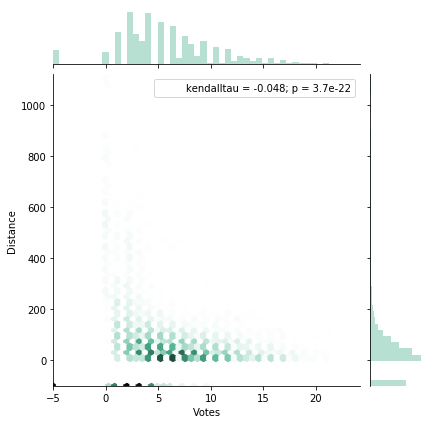

In [11]:
sns.jointplot(x="Votes", y="Distance", data=dv_all_do, kind="hex", stat_func=kendalltau, color="#4CB391")

1. Save a sample frame giving and idea about the scale
2. Perform Leave-2-Out cross-validation to create errors
3. Plot ROC curves. Need vote values. missing for DOs.
4. Check if same frames are missed across all cross-validation datasets
5. Create movies